In [3]:
from os import times
from urllib.request import thishost

from matplotlib.pyplot import xticks
from utils import stim_colors
%autoreload 2

In [274]:
%reload_ext autoreload
import os, sys, random
import numpy as np
import pandas as pd
import seaborn as sns

from scipy.stats import zscore
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import gridspec, rcParams
from datetime import datetime as dt, timedelta
import pingouin as pg
import scipy.stats as stats
from fish import Gafftopsail
sys.path.append(r'C://Users//Zichen//anaconda3//envs//2ptank//Lib//site-packages//')
import utils
path = ('C://Data//Imaging//251021_dotsweep//fish3//')
rcParams['font.size'] = 4  

In [275]:
fish = Gafftopsail(path, sequence = 5, filelist = ['stimulus', 'imaging'])
fish.stimulus_df.stim_name = [str(s) for s in fish.stimulus_df.stim_name]

In [276]:
def color_stims_plt(ax, stim_name, starttime, duration, stationary_time):
    if type(stim_name) == list:
        for babystim, stationary_time in zip(stim_name, stationary_time):
            color_stims_plt(ax, babystim, starttime, duration, stationary_time)
    else:
        if '[' in stim_name:
            color = utils.stim_colors[stim_name.split("'")[1]]
        else:
            color = utils.stim_colors[stim_name]
        ax.axvspan(xmin = starttime + stationary_time, xmax = starttime + duration,
                      color = color, linewidth = 0, alpha = 0.5)

__EACH STIM__

In [277]:
def get_pertrial_f(fish):
    """
    Get the dF/F for the fish organized by stimulus and trials, the f includes the entire duration of the stimulus (stationary + moving period)
    :param fish: 
    :param stim_onset_type: if 'overlap', the stationary time for overlap stim counts the time before the overlap starts; if 'gratings', the stationary time for overlap stim counts when the grating starts
    :return: 
    """
    stim_list = fish.stimulus_df.stim_name.unique()
    fish.stimulus_df.loc[:, 'stim_name'] = [str(i) for i in fish.stimulus_df.stim_name]
    f_pertrial_dict = {stim: None for stim in stim_list}
    for stim in stim_list:
        #get important stimulus information
        stim_df = fish.stimulus_df[fish.stimulus_df['stim_name'] == stim].reset_index(drop=True)
        duration = stim_df['duration'].iloc[0] + 20
        #define plotting range (what are the frames of data to grab in general)
        image_range_frame = (0, int((duration) / fish.image_s))#general
        #for this stimulus, get the data shaped like trial, neuron, time
        #axis 0: trial; axis 1: neuron; axis 2: frame
        f_pertrial_perplane = {plane: np.full(shape=(len(stim_df), len(fish.f_dict[plane]), image_range_frame[1] - image_range_frame[0]), fill_value=np.nan) for plane in fish.planes}
        for trial, stim_row in stim_df.iterrows():
            for plane in fish.planes:
                start_frame = utils.find_nearest_frameindex(fish.frametimes_dict[plane], stim_row['real_starttime_s'])#this is frmae at stim start time
                try:
                    f_pertrial_perplane[plane][trial, :, :] = fish.f_dict[plane].iloc[:, start_frame + image_range_frame[0]:start_frame + image_range_frame[1]]
                except ValueError:
                    print('imaging ends before last visstim')
                    temp_f = fish.f_dict[plane].iloc[:,start_frame + image_range_frame[0]:start_frame + image_range_frame[1]]
                    f_pertrial_perplane[plane][trial, :, :temp_f.shape[1]] = temp_f
        f_pertrial_dict[stim] = np.concatenate([f for f in f_pertrial_perplane.values()], axis = 1)#OG index still gets maintained
    return f_pertrial_dict

In [278]:
 #axis 0: trial; axis 1: neuron; axis 2: frame
f_pertrial_dict = get_pertrial_f(fish)

In [279]:
fish.f_all = pd.concat([fish.f_dict[p] for p in fish.planes])

In [264]:
stim_matrix =  np.array([['dot_l_3', 'dot_r_3'],
                        ['dot_l_5', 'dot_r_5'],
                        ['dot_l_10', 'dot_r_10'],
                        ['dot_l_20', 'dot_r_20'],
                        ['dot_l_40', 'dot_r_40']])#build your own 2d stimulus matrix according to the stim_name in your stimulus file

In [228]:
def plot_heatmap(axes, f_avgtrial, f_responding_sortindex, stationary_frame, baseline_frame, response_frame):
    """
    Plot a heatmap according to the sorted index and given vmin and vmax
    :return:
    """
    sns.heatmap(f_avgtrial[f_responding_sortindex], cmap = 'Greys_r', ax = axes, vmax = 0.8, vmin =0.0, cbar = False)
    axes.axvline(stationary_frame, color = 'white', linewidth = 2, linestyle = ':')
    axes.grid(False)
    axes.set_xticks([])
    axes.set_xticklabels([])
    axes.set_yticks([])
    axes.set_yticklabels([])


def plot_scatter(axes, fish, pos_all, f_responding, vmin, vmax, stim_cmap, axes_cmap = None):
    """
    Plot a scatter plot where:
    - only top 50% responding neurons are plotted
    - colored via stim_cmap
    :param axes:
    :param fish:
    :param pos_all:
    :param f_responding:
    :param vmin:
    :param vmax:
    :param stim_cmap:
    :return:
    """
    axes.imshow(fish.img_dict[0], cmap = 'Greys_r', origin = 'lower')
    alphas = np.clip(np.divide(np.subtract(np.abs(f_responding), np.nanpercentile(np.abs(f_responding), 50)), vmax), 0, 1)
    axes.scatter(x = pos_all['xpos'], y = pos_all['ypos'],s =.05, marker = '.', c = f_responding, alpha = alphas, cmap = stim_cmap, vmin = vmin, vmax = vmax)
    axes.axis(False)
    if axes_cmap is not None:#if grating, plot cmaps
        gradient = np.linspace(axes.get_ylim()[0], axes.get_ylim()[1], 256).reshape(-1, 1)
        gradient = np.flipud(gradient)
        axes_cmap.imshow(gradient, aspect="auto", cmap= stim_cmap, extent=[0, 0.1, axes.get_ylim()[0], axes.get_ylim()[1]])
        axes_cmap.set_xlim([0, .1])
        axes_cmap.axis(False)

def plot_pop_mean(axes, f_avgtrial, neurons, stim_color, linestyle, stationary_frame, baseline_frame, response_frame):
    """
    Plot the mean response of the neuron population selected, shaded area is 95%CI across neurons
    :return:
    """
    meantrace = np.mean(f_avgtrial[neurons], axis = 0)
    axes.plot(meantrace,  color =  stim_color, linestyle = linestyle)
    sem_trace = np.std(f_avgtrial[neurons], axis=0, ddof=1) / np.sqrt(len(neurons))
    ci_95 = 1.96 * sem_trace
    axes.fill_between(range(len(meantrace)), meantrace - ci_95, meantrace + ci_95, color= stim_color, alpha=0.3)
    axes.grid(False)
    axes.axvline(stationary_frame, linestyle = ':', color = stim_color, linewidth = 2)
    axes.set_ylabel('dF/F')
    axes.set_xlabel('frames')

def plot_overlap_responding(fish, f_pertrial_dict, stim_matrix, baseline_s, response_s, stim_onset_type, top_percent):
    """
    :param fish: a fish object
    :param stim_list: the list of stimuli to be plotted, have to be all string
    :param baseline_s: positive seconds before the stim onset to use as baseline
    :param response_s: positive seconds after the stim onset to use as baseline
    :param stim_onset_type: the type stim to be used as boundary ('gratings', 'dot' or 'overlap'), note that 'overlap' can't be used in trails where thaere's no stimuli
    :return:
    """
    fish.stimulus_df.loc[:, 'stim_name'] = [str(i) for i in fish.stimulus_df.stim_name]
    pos_all = pd.concat([fish.pos_dict[plane] for plane in fish.planes], axis = 0)
    image_s = np.diff(fish.frametimes_dict[0]).mean()
    def makesubplots(stim_matrix, extra_col = False):
        if extra_col:
            return plt.subplots(stim_matrix.shape[0], stim_matrix.shape[1] + 1,
                            figsize=(stim_matrix.shape[1], stim_matrix.shape[0]), dpi=200,
                            gridspec_kw= {'hspace': 0.5, 'wspace': 0.5, 'width_ratios': [1] * stim_matrix.shape[1] + [0.1]}, sharey = True)
        else:
            return plt.subplots(stim_matrix.shape[0], stim_matrix.shape[1],
                                figsize=(stim_matrix.shape[1], stim_matrix.shape[0]), dpi=200,
                                gridspec_kw= {'hspace': 0.5, 'wspace': 0.5}, sharey = True)
    fig_omrheatmap, ax_omrheatmap = makesubplots(stim_matrix)
    fig_omrscatter, ax_omrscatter = makesubplots(stim_matrix, extra_col = True)
    fig_topomr, ax_topomr = makesubplots(stim_matrix)
    fig_bottomomr, ax_bottomomr = makesubplots(stim_matrix)
    # for each stimulus
    for row in range(stim_matrix.shape[0]):
        for col in range(stim_matrix.shape[1]):
            axes_omrheatmap = ax_omrheatmap[row, col]
            axes_omrscatter = ax_omrscatter[row, col]
            axes_topomr = ax_topomr[row, col]
            axes_bottomomr = ax_bottomomr[row, col]
            stim = stim_matrix[row, col]
            if stim == 'skip':
                axes_omrheatmap.axis('off')
                axes_omrscatter.axis('off')
                axes_topomr.axis('off')
                axes_bottomomr.axis('off')
            else:
                #get relevant stimulus inforamtion
                f_pertrial = f_pertrial_dict[stim]
                stim_df = fish.stimulus_df[fish.stimulus_df['stim_name'] == stim].reset_index(drop=True)
                if '[' in stim:#overlap_stim
                    grating_stationary_time = stim_df['stationary_time'].iloc[0][1]
                    overlap_stationary_time = stim_df['stationary_time'].iloc[0][0]
                    if stim_onset_type == 'gratings':
                        stationary_time = grating_stationary_time
                    elif stim_onset_type == 'overlap':
                        stationary_time = overlap_stationary_time
                else:
                    stationary_time = stim_df['stationary_time'].iloc[0]
                #define plotting range (what are the frames of data to grab in general)
                stationary_frame = int(stationary_time/image_s)
                baseline_frame = int((stationary_time - baseline_s)/ image_s)#how many frame before stationary frame
                response_frame = int((stationary_time + response_s)/ image_s)#how many frame after stationary frame
                #get baselne/response information
                #get all the baseline per trial
                f_pertrial_baseline = f_pertrial[:, :, baseline_frame:stationary_frame]
                f_pertrial_response = f_pertrial[:, :, stationary_frame:response_frame]
                f_pertrial_baselinemean = np.nanmean(f_pertrial_baseline, axis = 2)#mean response across response frames
                f_pertrial_responsemean = np.nanmean(f_pertrial_response, axis = 2)#mean baseline across baseline frames
                f_responding = (f_pertrial_responsemean - f_pertrial_baselinemean) #for each trial, response = response - baseline
                f_responding = np.nanmean(f_responding, axis = 0)#response index across trials
                f_avgtrial = np.nanmean(f_pertrial, axis=0)#general trace across trials
                # get top responding neurons and the vmin/vmax
                f_responding_sortindex = f_responding.argsort()[::-1]
                top_neurons = f_responding_sortindex[:int(top_percent * len(f_responding_sortindex))]
                bottom_neurons = f_responding_sortindex[-int(top_percent * len(f_responding_sortindex)):]
                abs_f_responding = np.abs(f_responding)
                vmax = np.percentile(abs_f_responding, 99)
                vmin = -vmax
                stim_color = (1, 0, 0, 1)#utils.stim_colors[stim]
                stim_cmap = utils.make_cmap(stim_color, 'stim_cmap')
                #actually plotting
                plot_heatmap(axes_omrheatmap, f_avgtrial, f_responding_sortindex, stationary_frame, baseline_frame, response_frame)
                plot_scatter(axes_omrscatter, fish, pos_all, f_responding, vmin, vmax, stim_cmap, axes_cmap = ax_omrscatter[row, -1])
                plot_pop_mean(axes_topomr, f_avgtrial, top_neurons, stim_color, '-', stationary_frame, baseline_frame, response_frame)
                plot_pop_mean(axes_bottomomr, f_avgtrial, bottom_neurons, stim_color, '-', stationary_frame, baseline_frame, response_frame)
    return fig_omrheatmap, fig_omrscatter, fig_topomr, fig_bottomomr


(<Figure size 400x1000 with 10 Axes>,
 <Figure size 400x1000 with 15 Axes>,
 <Figure size 400x1000 with 10 Axes>,
 <Figure size 400x1000 with 10 Axes>)

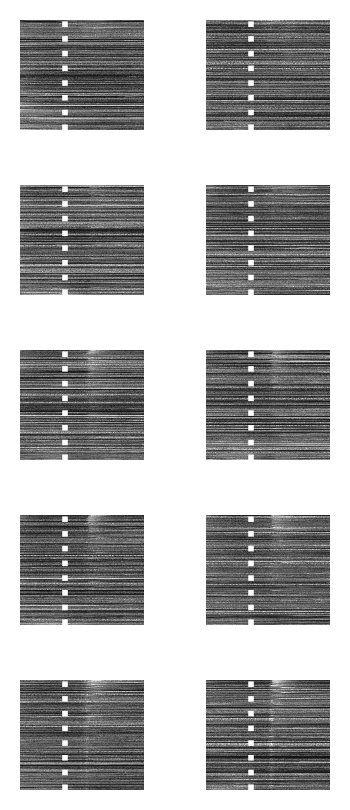

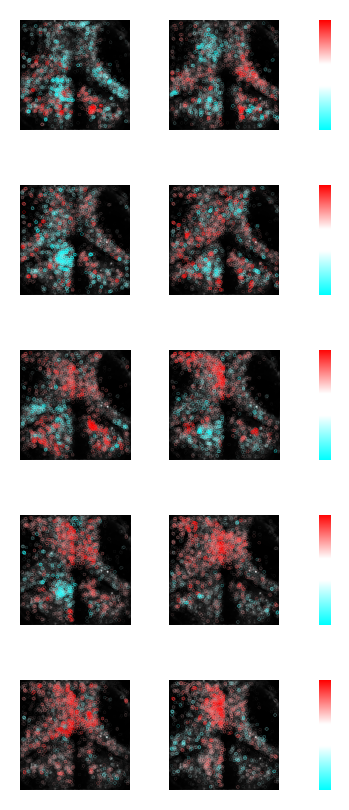

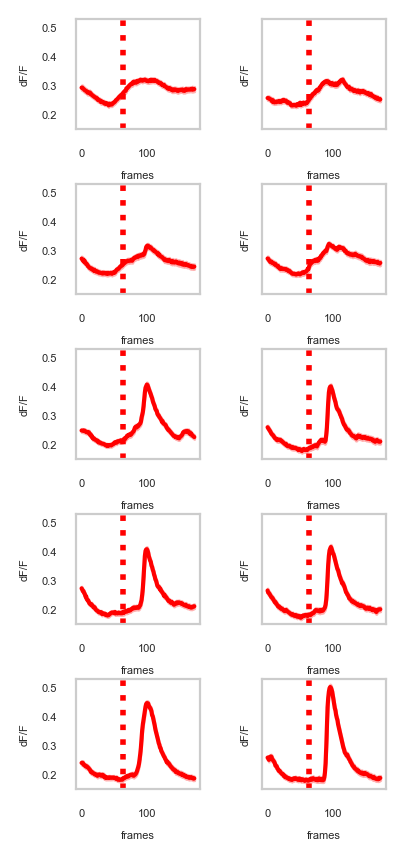

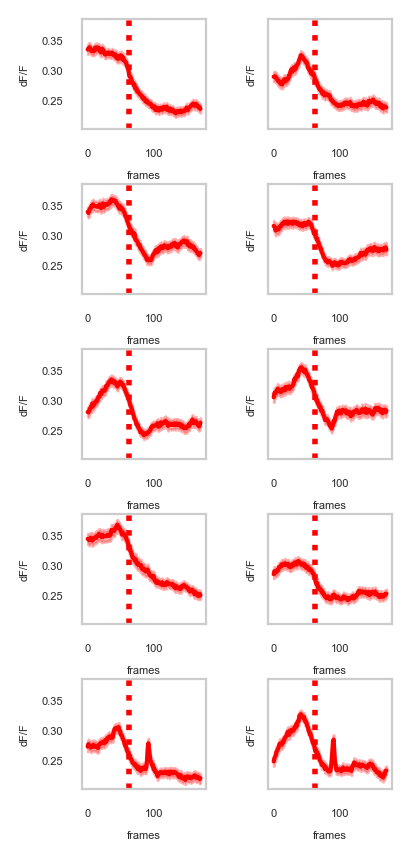

In [229]:
plot_overlap_responding(fish, f_pertrial_dict, stim_matrix, baseline_s =10, response_s = 20, stim_onset_type = 'overlap', top_percent = 0.05)

__barcoding__

In [280]:
def select_dotbarcode(fish, f_pertrial_dict, baseline_s =10, response_s = 10, perc_trial_threshold = 0.8):
    """Select barcoded neurons with 1.8std above baseline and below 1.8std for the opposite stimulus"""
    #TODO: replace xpos with rois
    #build a neuron accumulator
    stim_list = fish.stimulus_df.stim_name.unique()
    dot_stim = [s for s in stim_list if ('dot' in s) and ('[' not in s)]
    all_n_index = []
    for plane in fish.planes:
        all_n_index = all_n_index + list(fish.f_dict[plane].index)
    barcode = pd.DataFrame(columns = dot_stim, index = all_n_index)
    #actually picking barcode neurons
    barred_neurons = {s: None for s in dot_stim}
    for stim in dot_stim:
        stim_df = fish.stimulus_df[fish.stimulus_df['stim_name'] == stim].reset_index(drop=True)
        stationary_time = stim_df['stationary_time'].iloc[0]
        #define plotting range (what are the frames of data to grab in general)
        stationary_frame = int(stationary_time/fish.image_s)
        baseline_frame = int((stationary_time - baseline_s)/ fish.image_s)#how many frame before stationary frame
        response_frame = int((stationary_time + response_s)/ fish.image_s)#how many frame after stationary frame
        #get all the baseline per trial
        f_pertrial = f_pertrial_dict[stim]
        f_pertrial_baseline = f_pertrial[:, :, baseline_frame:stationary_frame]
        f_pertrial_response = f_pertrial[:, :, stationary_frame:response_frame]
        f_pertrial_baselinemean = np.mean(f_pertrial_baseline, axis = 2)
        f_pertrial_baselinestd = np.std(f_pertrial_baseline, axis = 2)
        f_pertrial_responsemean = np.max(f_pertrial_response, axis = 2)
        #if response > baselien + 1.8*std
        f_increase = f_pertrial_responsemean - f_pertrial_baselinemean
        f_responding_sortindex = np.argsort(f_increase.mean(axis = 0))[::-1]#from most responsive to least responsive in mean across trials
        f_responding = f_increase/f_pertrial_baselinestd >=3
        f_responding_percentage = np.divide(np.sum(f_responding, axis = 0), f_responding.shape[0])
        barcode.loc[:, stim] = f_responding_percentage
        barred_neurons[stim] = list(barcode[(barcode[stim] >= perc_trial_threshold)].index)#get barcodded neurons
        barred_neurons[stim] = [i for i in f_responding_sortindex if i in barred_neurons[stim]]#sort the barred neurons max to min
    return barred_neurons

def plot_dotbarcode(fish, stim_matrix, barred_dotneurons):
    fig, ax = plt.subplots(stim_matrix.shape[0], stim_matrix.shape[1] * 2, dpi = 400, figsize = (10, 10))
    for row in range(stim_matrix.shape[0]):
        for col in range(stim_matrix.shape[1]):
            ax_img = ax[row, col * 2]
            ax_heatmap = ax[row , col * 2 + 1]
            stim = stim_matrix[row, col]
            ax_img.imshow(fish.img_dict[0], cmap = 'Greys_r', origin = 'lower', vmax = 100)
            ax_img.scatter(x = fish.pos_all.loc[barred_dotneurons[stim], 'xpos'], y = fish.pos_all.loc[barred_dotneurons[stim], 'ypos'],s =1, marker = '.', linewidth = 0.5,  c = range(len(barred_dotneurons[stim])), cmap = 'plasma', alpha = 1)
            ax_img.grid(False)
            ax_img.set_xticks([])
            ax_img.set_yticks([])
            f_stim = f_pertrial_dict[stim][:, barred_dotneurons[stim], :]
            # Reorder axes to (neurons, trials, time)
            f_stim = np.transpose(f_stim, (1, 0, 2))                        # now shape: (neurons, trials, time)
            # Flatten trials and time together for each neuron
            f_stim = f_stim.reshape(f_stim.shape[0], -1)
            sns.heatmap(f_stim, xticklabels = False, yticklabels = False, ax = ax_heatmap, vmin = 0, vmax = 1, cmap = 'Greys', cbar = False)

In [281]:
barred_dotneurons = select_dotbarcode(fish, f_pertrial_dict, baseline_s =15, response_s =20, perc_trial_threshold = 0.8)

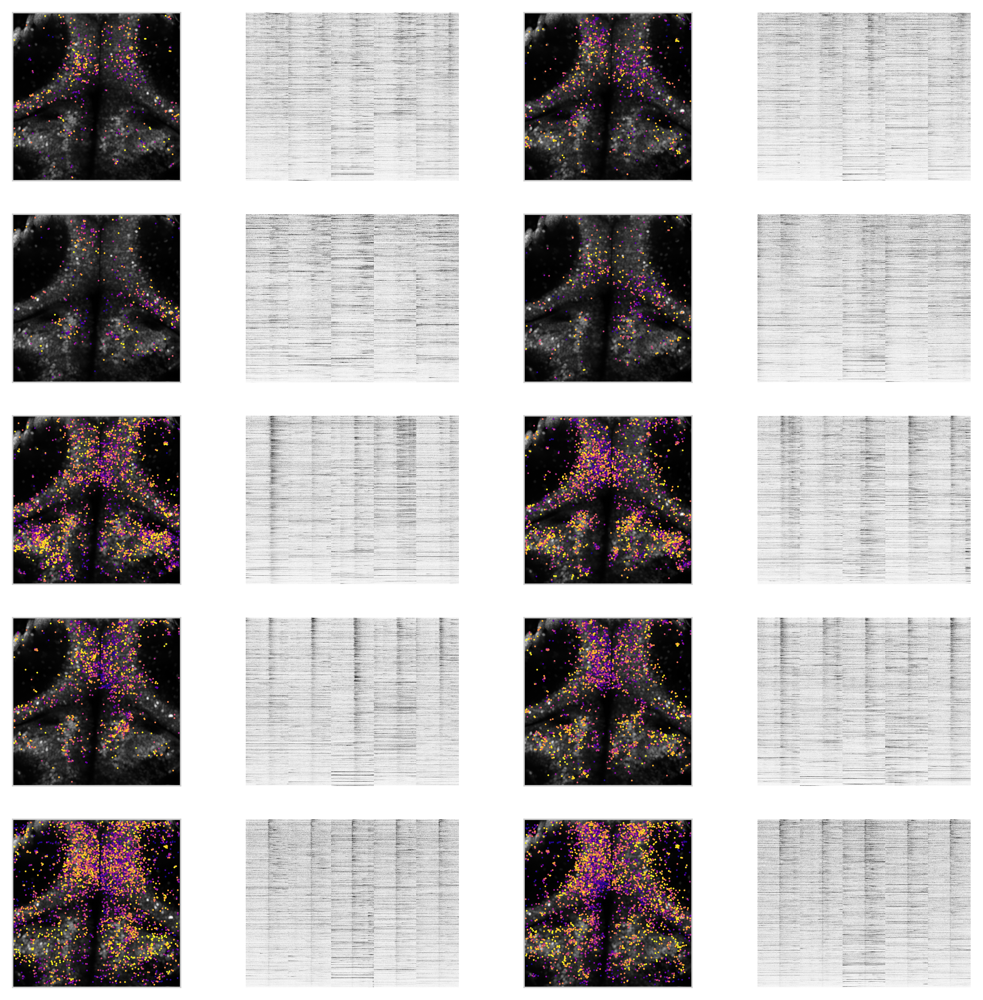

In [267]:
plot_dotbarcode(fish,stim_matrix, barred_dotneurons)

In [282]:
#get dot tunning for each individual neurons
baseline_s = 5
response_s = 10
side = 'l'
stimlist = [s for s in stim_matrix.flatten() if side in s]
tuning = pd.DataFrame(index = fish.f_all.index, columns = stimlist)
for stim in stimlist:
    stim_df = fish.stimulus_df[fish.stimulus_df['stim_name'] == stim].reset_index(drop=True)
    stationary_time = stim_df['stationary_time'].iloc[0]
    #define plotting range (what are the frames of data to grab in general)
    stationary_frame = int(stationary_time/fish.image_s)
    baseline_frame = int((stationary_time - baseline_s)/ fish.image_s)#how many frame before stationary frame
    response_frame = int((stationary_time + response_s)/ fish.image_s)#how many frame after stationary frame
    #get all the baseline per trial
    f_pertrial = f_pertrial_dict[stim]
    f_pertrial_baseline = f_pertrial[:, :, baseline_frame:stationary_frame]
    f_pertrial_response = f_pertrial[:, :, stationary_frame:response_frame]
    f_pertrial_baselinemean = np.mean(f_pertrial_baseline, axis = 2)
    f_pertrial_responsemean = np.max(f_pertrial_response, axis = 2)
    f_pertrial_response = f_pertrial_responsemean - f_pertrial_baselinemean
    f_avg_response = np.mean(f_pertrial_response, axis = 0)
    tuning.loc[fish.f_all.index, stim] = f_avg_response
tuning_dist = []
x = np.array(range(len(stimlist)))
for _, tun in tuning.iterrows():
    tun = np.array(tun)
    tun_norm = tun/np.sum(tun)
    mean = np.sum(x * tun_norm)
    var = np.sqrt(np.sum(tun_norm * (x - mean)**2))
    tuning_dist = tuning_dist + [[mean, var]]
tuning_dist = pd.DataFrame(data = tuning_dist, index = fish.f_all.index, columns = ['mean', 'var'])
#tuning_dist = pd.DataFrame(data = tuning_dist, index = fish.f_all.index, columns = ['skew', 'loc', 'spread'])

<Axes: >

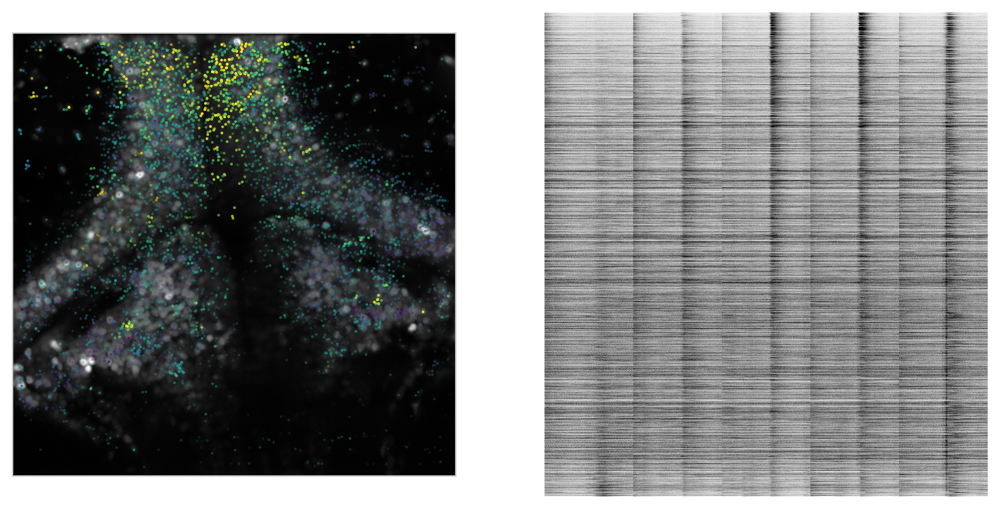

In [283]:
fig, ax = plt.subplots(1, 2, dpi = 400, figsize = (10, 5))
ax_img = ax[0]
ax_heatmap = ax[1]
ax_img.imshow(fish.img_dict[0], cmap = 'Greys_r', origin = 'lower', vmax = 100)
tuning_c = tuning_dist['mean']
tuning_a = -tuning_dist['var']
tuning_a = np.clip((tuning_a - np.nanpercentile(tuning_a, 10)) / (np.nanpercentile(tuning_a, 99) - np.nanpercentile(tuning_a,10)), 0, 1)
#tuning_a = [i if not np.isnan(i) else 0 for i in tuning_a]
ax_img.scatter(x = fish.pos_all.loc[tuning.index, 'xpos'], y = fish.pos_all.loc[tuning.index, 'ypos'],s =5, marker = '.', linewidth = 0.5,  c = tuning_c, cmap = 'viridis', alpha  = tuning_a, vmin = np.nanpercentile(tuning_c, 1), vmax = np.nanpercentile(tuning_c, 99))
ax_img.grid(False)
ax_img.set_xticks([])
ax_img.set_yticks([])
sort_index = list(tuning_dist.sort_values('var').index)
f_stimlist = []
for stim in stimlist:
    f_stim = f_pertrial_dict[stim].mean(axis = 0)[sort_index]#mean trace across trials
    f_stimlist = f_stimlist + [f_stim]
f_stim = np.concatenate(f_stimlist, axis = 1)
sns.heatmap(f_stim, xticklabels = False, yticklabels = False, ax = ax_heatmap, vmin = 0, vmax = .5, cmap = 'Greys', cbar = False)

(array([   3.,    8.,  138.,  847., 2332., 2166.,  970.,  524.,  129.,
           7.]),
 array([1.06734466, 1.28947182, 1.51159897, 1.73372612, 1.95585327,
        2.17798043, 2.40010758, 2.62223473, 2.84436188, 3.06648904,
        3.28861619]),
 <BarContainer object of 10 artists>)

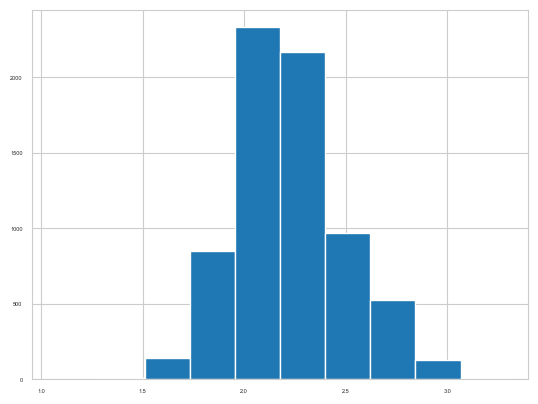

In [252]:
plt.hist(tuning_c)